# Plotting en Julia
En este cuaderno se cubren las partes más importantes para poder graficar en Julia. Para ello se va a utilizar el paquete básico __Plots__, en base a este se crean muchos otros y por tanto se utiliza este como base. Julia permite grandísima variedad en sus _plots_ , principalmente por la facilidad de poder utilizar diferentes __backends__. Dado que no se puede cubrir cada parte del mar de posibilidades se tratan de cubrir las características más útiles que se pueden necesitar en el día a día. Se explican temas como:

- Plotting básico
- Que son __backends__ en Julia
- Atributos 
- Funcionamiento de __subplots__
- Otros temas
    - Scripting
    - Otros tipos de plots
    - Uso del paquete __Polynomials__

Para algunos ejemplos se utiliza el paquete __Polynomials__, este paquete como dice su nombre permite ingresar polinomios en Julia de forma fácil, además, permite obtener las soluciones de este. En este caso se va a utilizar para obtener datos a graficar.


## Índice

- [Plotting Básico](#Plotting-basico)
    - [Line Plots](#Line-Plots)
- [Backends](#Backends)
- [Atributos](#Atributos)
    - [Tipos de Línea](#Tipos-de-linea)
    - [Tipos de graficas](#Tipos-de-graficas)
    - [Atributos para los ejes](#Atributos-para-los-ejes)
    - [Marcadores](#Marcadores)
- [Subplots en Julia](#Subplots-en-Julia)
- [Otros temas](#Otros-temas)
    - [Scripting](#Scripting)
    - [Uso de temas](#Uso-de-temas)
    - [Uso de Polynomials](#Uso-de-Polynomials)


## Plotting básico
Para poder empezar a realizar plots primero se debe instalar el paquete __Plots__ por medio de
 ```julia
  using Pkg
  Pkg.add("Plots")
  Pkg.add("Polynomials")
 ```
De paso se instala el paquete __Polynomials__ que se ve a utilizar. Luego se debe llamar al paquete para poder utilizarlo:


In [1]:
using Plots

### Line Plots
El tipo más básico de __Plots__ en Julia son los gráficos de línea y es el tipo por defecto que se utiliza a menos que se indique otra forma por medio de los atributos que se verán más adelante. Para crear un gráfico se utiliza la función <code>plot()</code> a dicha función se le indican los ejes, por ejemplo:


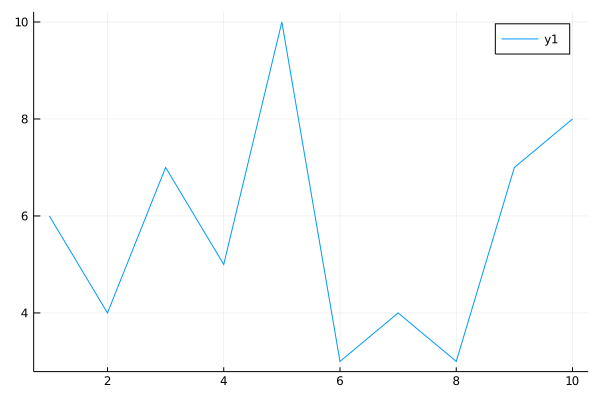

In [2]:
x = 1:10
y = rand(1:10, 10)
plot(x, y)

También se pueden graficar más de una línea en la gráfica utilizando <code>plot!()</code> dicha función modifica el __Plot__ actual y agrega otra línea a graficar, en este caso sería el anterior:

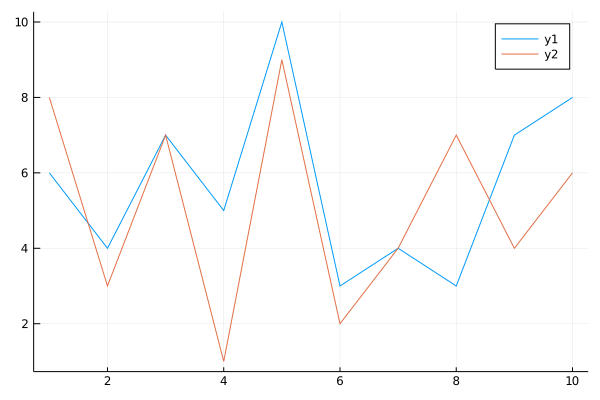

In [3]:
z = rand(1:10, 10)
plot!(x, z)

En el caso que hubieran más de un __Plot__ actual se puede asignar un identificador a cada uno y luego se le indican los valores a graficar en ese mismo plot, por ejemplo:

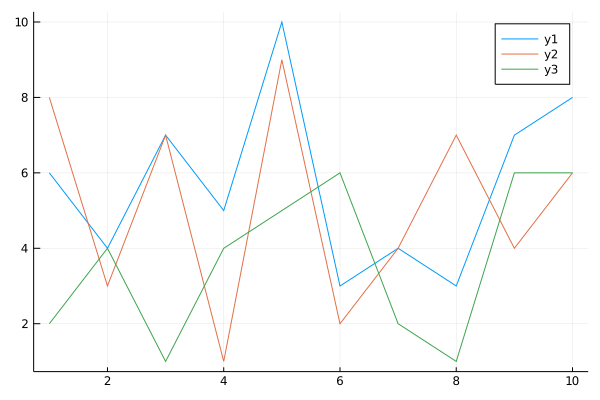

In [4]:
grafica = plot(x, y) 
plot!(grafica, x, z)
w = rand(1:10, 10)
plot!(grafica, x, w)

Otra forma más compacta de agregar varias series de datos seria indicar el __eje x__ de todas los datos y luego solo indicar los diferentes __ejes y__ a graficar de la siguiente forma:

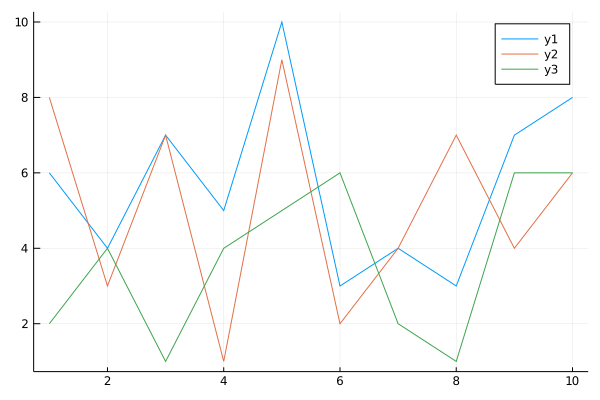

In [5]:
grafica2 = plot(x, [y,z,w])

## Backends
En Julia por lo general se utiliza el paquete `Plots` para graficar, sin embargo, este no es una librería como tal sino una interfaz la cual utiliza diferentes librerías para graficar. Lo que el paquete hace es interpretar los comandos de otras librerías, la librería que se utiliza para generar los plots se llama __backend__. La ventaja de esto es que se pueden utilizar diferentes librerías para realizar plots bajo la misma sintaxis. 

En general sino se escoge un __backend__ el paquete utiliza alguno por defecto que encuentre instalado. Para poder instalar nuevos __backends__ se pueden instalar similar a un paquete: 
 ```julia
    using Pkg
    Pkg.add("Name")
 ```
Algunos __backends__ populares son:

- Plotly
- GR
- PyPlot
- PlotlyJS

En este cuaderno se utilizan solo GR y PyPlot, pero se invita a utilizar los otros si fuera necesario. Para instalarlos solo se debe correr:
 ```julia
    Pkg.add("GR")
    Pkg.add("PyPlot")
 ```
En la terminal de Julia. 

Cada uno de ellos tienen sus propias ventajas y desventajas, a los usuarios de Python se les permite utilizar PyPlot en Julia de forma fácil. Los diferentes __backends__ tienen diferentes atributos que pueden utilizar, dicha lista se puede encontrar en la [documentación oficial](https://docs.juliaplots.org/latest/generated/supported/). Para poder utilizar un __backend__ se utiliza la siguiente sintaxis antes de graficar: 
 ```julia
    pyplot()
 ```
La página de [documentación](https://docs.juliaplots.org/latest/generated/supported/) de Julia tiene una tabla resumen de las mejores características para cada tipo de __backend__ y se invita a revisar cual es que se desea. Por el momento se continúa graficando con GR por tanto se corre:


In [6]:
gr()

Plots.GRBackend()

## Atributos
Los gráficos que se realizaron anteriormente les faltan varias cosas importantes:
 
- Nombres de los ejes
- Leyenda 
- Título del gráfico

Todas estas propiedades se agregan y modifican por medio de los atributos que uno puede utilizar para los gráficos. Existen gran variedad de atributos diferentes, acá solo se cubren algunos de ellos que se consideran los más relevantes para un uso general. 

Comenzando el título, para agregar un título a un plot se utiliza el keyword <code>title</code>, para agregar los nombres de las leyendas se utiliza el keyword <code>label</code>. Por ejemplo, entonces:


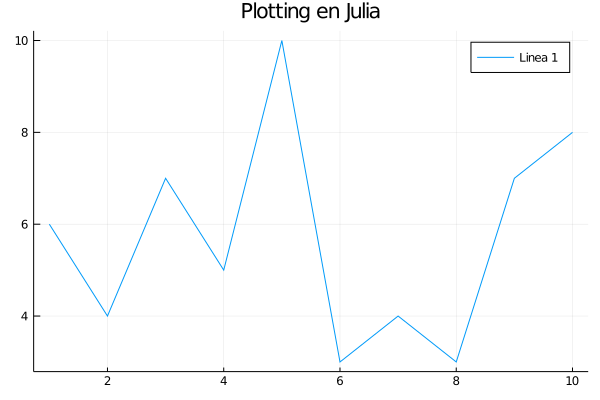

In [7]:
p = plot(x, y, title = "Plotting en Julia", label = "Linea 1")

Cuando se tienen varias series de datos para modificar su nombre en la leyenda se debe poner el nombre de cada una en orden separados por un __espacio__, por ejemplo:

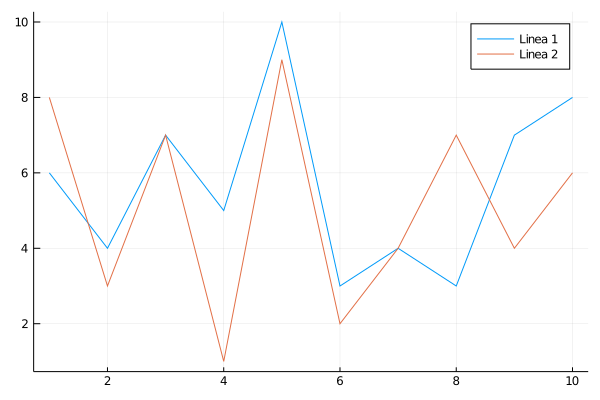

In [8]:
plot(x, [y,z], label = ["Linea 1" "Linea 2"])

Para agregar nombres a los ejes se tienen dos keywords <code>xlabel</code> y <code>ylabel</code>, modificando el plot anterior:

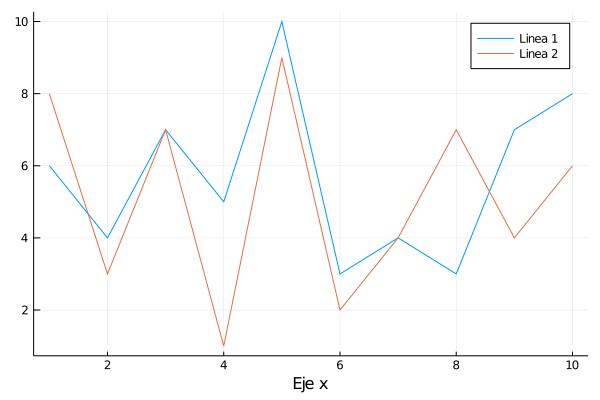

In [9]:
plot!(xlabel = "Eje x")

Otra manera de modificar el plot actual es por medio de utilizar el keyword de como si fuera un función de la forma:
  ```julia
   ylabel!("Nombre")
    ```
La nomenclatura anterior pondría el nombre definido del __eje y__ en el grafico actual.


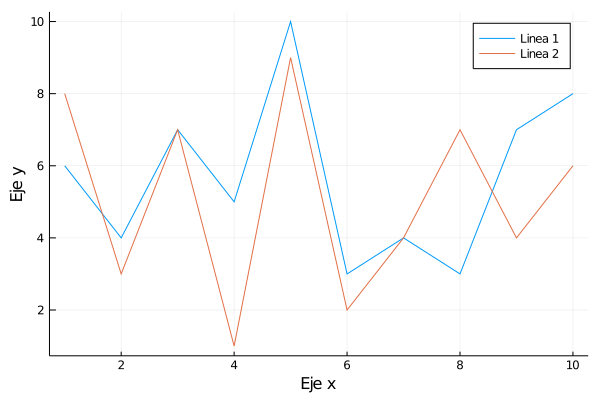

In [10]:
ylabel!("Eje y")

Otro atributo interesante es poder cambiar el grosor de las líneas por medio del keyword <code>lw</code>, creando un nuevo gráfico:

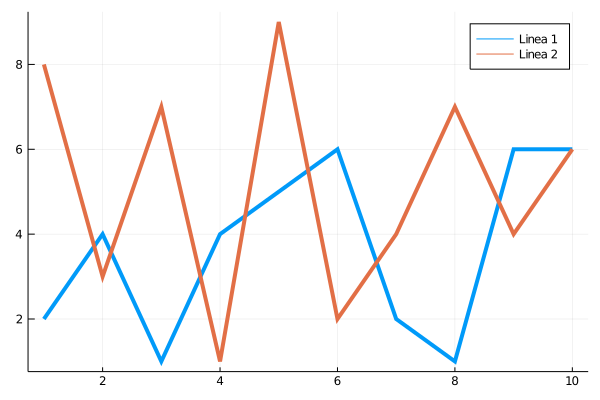

In [11]:
plot(x, [w,z], label = ["Linea 1" "Linea 2"], lw =4)

### Tipos de Línea
Continuando con atributos para las líneas, se puede cambiar el estilo de línea por medio del alias `ls` o `linestyle`: 

- :dot
- :solid
- :dash
- :dashdot

*Es importante revisar cuales atributos y características están implementados en el __backend__ que se esté utilizando.*

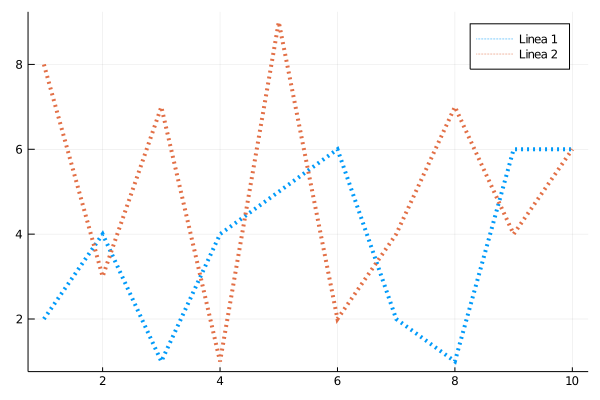

In [12]:
plot(x, [w,z], label = ["Linea 1" "Linea 2"], lw =4, ls = :dot)

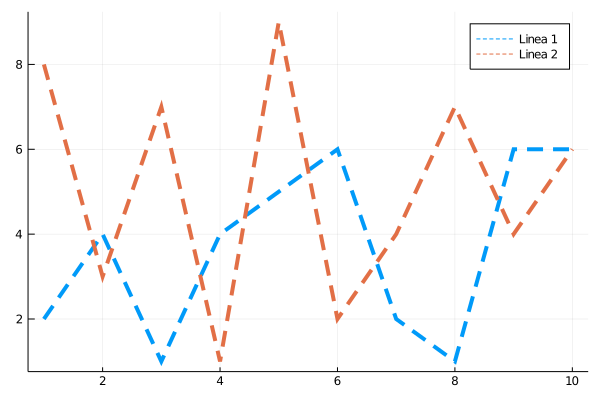

In [13]:
plot(x, [w,z], label = ["Linea 1" "Linea 2"], lw =4, ls = :dash)

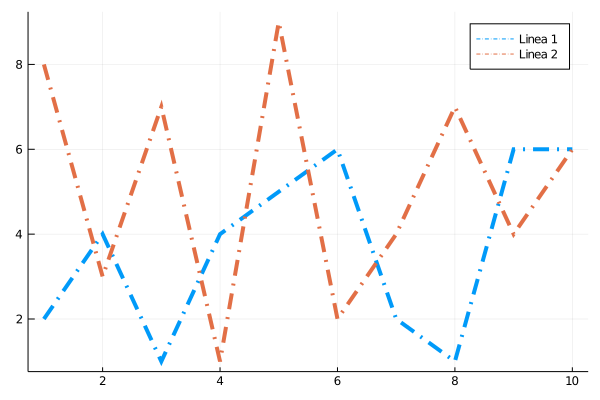

In [14]:
plot(x, [w,z], label = ["Linea 1" "Linea 2"], lw =4, ls = :dashdot)

In [15]:
El color de todas las lineas de puede cambiar por medio del alias `c` o el keyword `seriescolor`:

LoadError: syntax: extra token "color" after end of expression

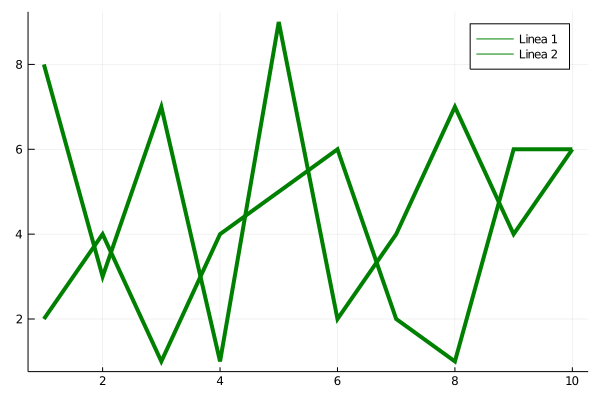

In [16]:
plot(x, [w,z], label = ["Linea 1" "Linea 2"], lw =4, c = :green)

Si más bien lo que se quiere es darle un color especifico a cada línea se puede hacer algo como lo siguiente de forma manual:

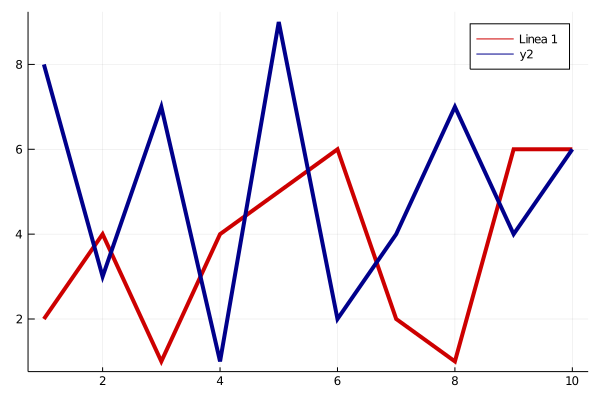

In [17]:
plot(x, w, label = ["Linea 1" "Linea 2"], lw =4, c = :red3)
plot!(x,z, lw = 4, c = :darkblue)

Para más detalles de cuales colores se pueden utilizar y demás información se puede encontrar en [Julia Colors](https://docs.juliaplots.org/latest/colors/).

### Tipos de graficas
Otro atributo interesante que se puede modificar es el tipo de grafico que se está realizando, por ejemplo, existen los tipos: __steppre__ y __scatter__, entre otros. Diferentes tipos se pueden utilizar para diferentes situaciones a continuación se muestra algunos ejemplos:

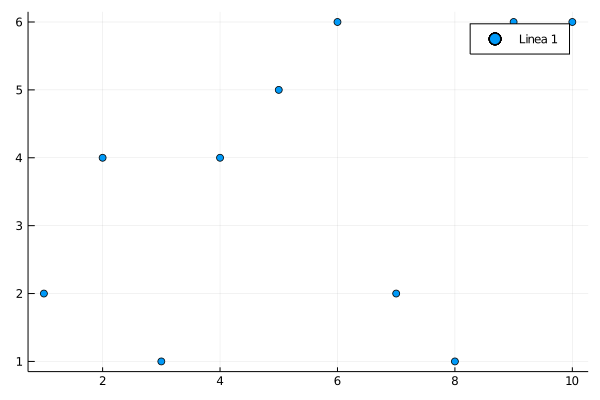

In [18]:
plot(x, w, label = "Linea 1", lw =4, st = :scatter)

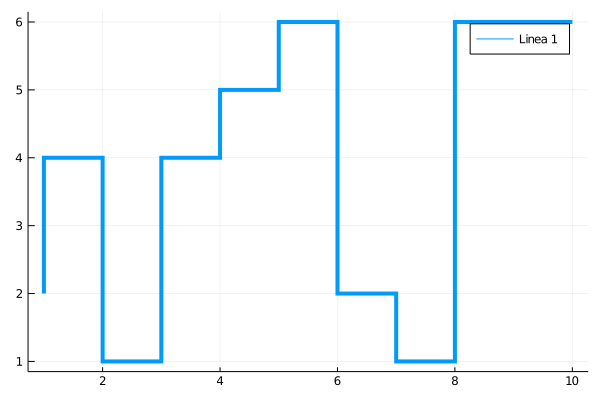

In [19]:
plot(x, w, label ="Linea 1", lw =4, st = :steppre)

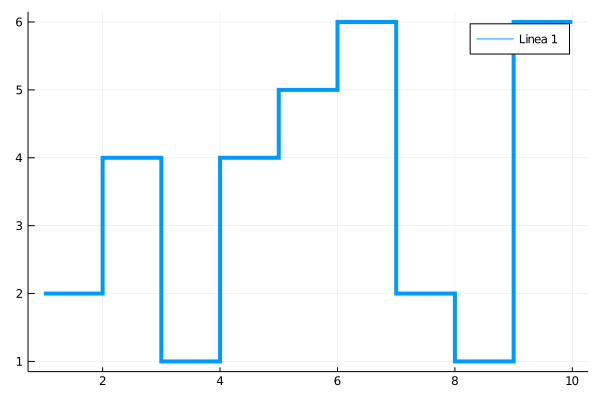

In [20]:
plot(x, w, label = "Linea 1", lw =4, st = :steppost)

Existen gran variedad de estilos diferentes que se pueden utilizar, en esta guía solo se cubren algunos. Todos los tipos soportados se puede encontrar en la página de [atributos para las series](https://docs.juliaplots.org/latest/generated/attributes_series/) en la sección de _series type_. También se pueden definir el tipo de grafica de forma externa usando el nombre el tipo en vez de `plot`, por ejemplo:
 ```julia
    histogram(x, y)
    scatter(x, y)
    heatmap(x, y)
 ```
__Solo algunos tipos se pueden definir de esta forma.__

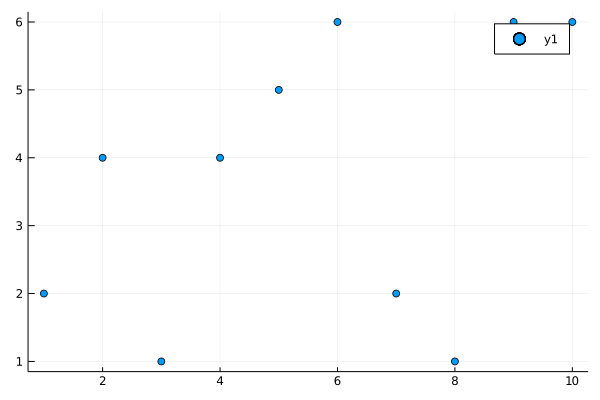

In [21]:
scatter(x, w)

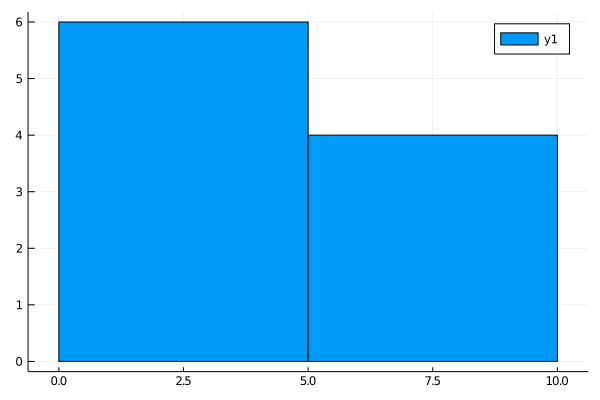

In [22]:
histogram(x, w)

### Atributos para los ejes
Se pueden escoger los límites de los ejes por medio del atributo __lim__, por ejemplo:

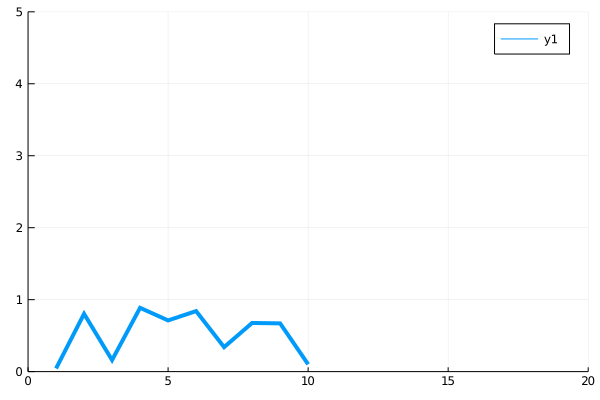

In [23]:
data = rand(10)
x_line = 1:10
plot(x_line, data, xlims = (0,20), ylims = (0,5), lw =4)

Al igual que algunos otros atributos se puede modificar por si solo de forma explícita por medio de `xlims!()`

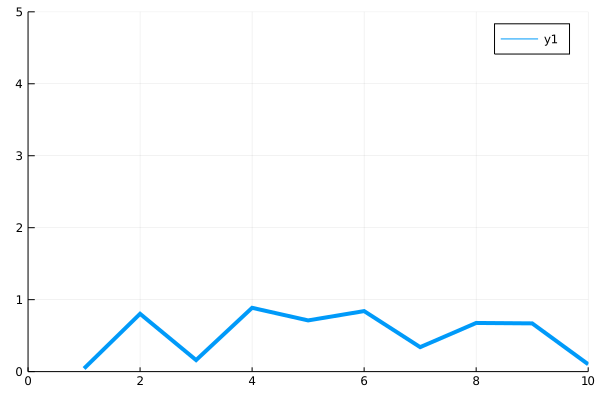

In [24]:
xlims!(0,10)

También se puede decir la escala de los ejes de forma fácil, sin embargo, se debe recordar que algunos __backends__ soportan solo algunos tipos de escalas. Por ejemplo, en general existen:
 
 - :log10
 - :ln
 - :log2

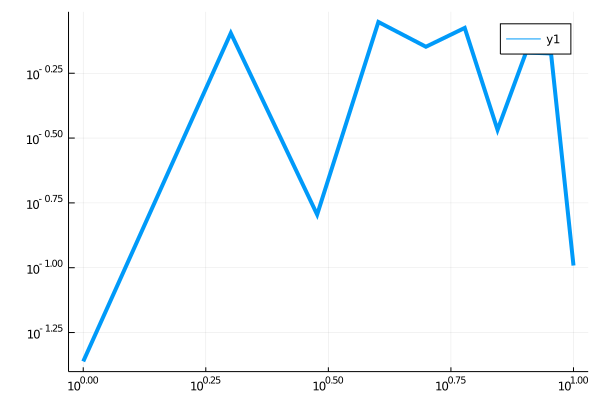

In [25]:
plot(x_line, data, lw =4, scale = :log10)

Existen más atributos como `minorgrid`, o `grid` los cuales se pueden habilitar y deshabilitar respectivamente:

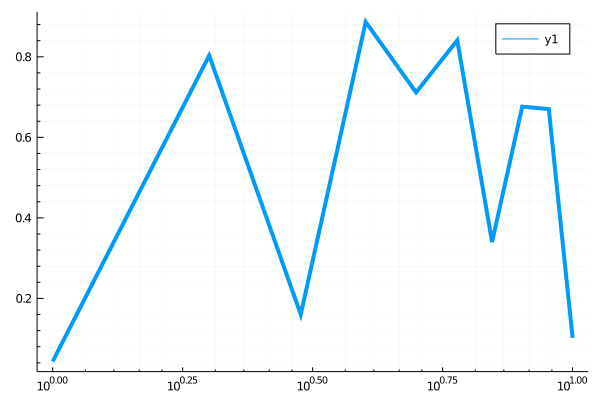

In [26]:
plot(x_line, data, lw =4, xscale = :log10, minorgrid = true, grid = false)

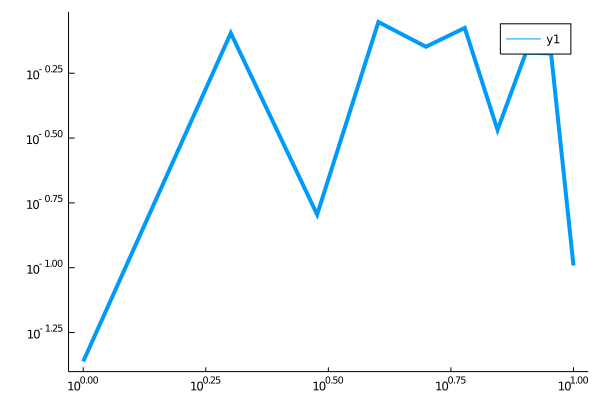

In [27]:
plot(x_line, data, lw =4, scale = :log10, grid = false)

Se puede hacer cosas más interesantes con `grid` como solo habilitar líneas hacia ciertos ejes, o cambiar el tipo de línea o inclusive aumentar o disminuir su grosor. Todos los atributos relacionados con los ejes o _axis_ se puede encontrar en la página de [_axis attributes_](http://docs.juliaplots.org/latest/generated/attributes_axis/). Por ejemplo:

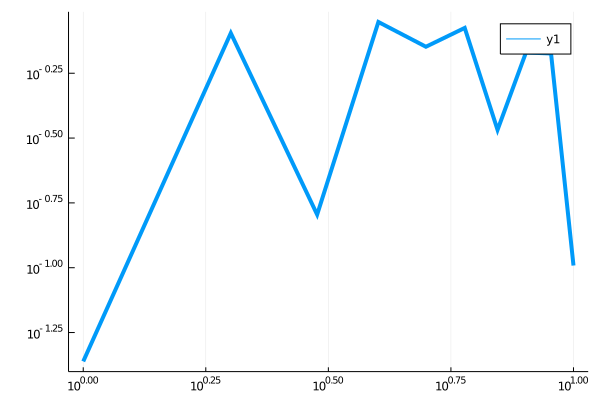

In [28]:
plot(x_line, data, lw =4, scale = :log10, grid = :x)

Otros atributos que se pueden modificar para los ejes son, por ejemplo:
 
  - `xlabel` modifica el nombre del eje
  - `xlims` modifica los límites del eje
  - `xticks` cambia cada cuanto se muestra un valor en el eje x, se modifica por medio de un rango
  - `xscale` modifica la escala del eje en especifico
  - `xflip` da vuelta al eje x, como un espejo
  - `xtickfont` modifica el tipo de letra de los números desplegados en el eje, también puede modificar el tamaño
  
Por ejemplo, modificando todo lo anterior: 

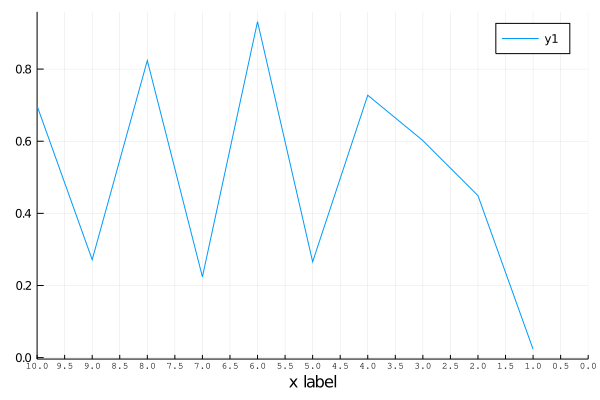

In [29]:
gr()
plot(rand(10),
    xlabel = "x label",
    xlims = (0,10),
    xticks = 0:0.5:10,
    xscale = :identity,
    xflip = true,
    xtickfont = font(5, "Courier")
)

En el caso anterior no es necesario darle un rango al eje `x`, Julia automáticamente crea un rango 1:10 para el set de valores. Existen también las versiones para el eje `y` y `z`, también se pueden cambiar los parámetros de todos los ejes por medio del keyword `axis`.

### Marcadores
En Julia existentes diferentes opciones de marcadores que se pueden utilizar y modificar según los intereses de uno. Por ejemplo, se pueden escoger:
 
- Tipo de marcador con `markershape`
- Tamaño del marcador con `markersize`
- Intensidad del marcador con `markeralpha`
- Color del marcador con `markercolor`
- Grosor de las líneas del contorno del marcador `markerstrokewidth`
- Intensidad de las líneas del contorno `markerstrokecolor`
- Estilo de las líneas del contorno `markerstrokestyle`

Dentro de algunos tipos de marcador hay: 

- hexagon
- circle
- diamond 
- xcross
- cross
- pentagon
- star4
- star6 

Entre otros que se pueden encontrar en la documentación en la parte de [atributos para markershape](https://docs.juliaplots.org/latest/generated/attributes_series/). A continuación se muestran algunos ejemplos de cómo los diferentes atributos modifican los gráficos.

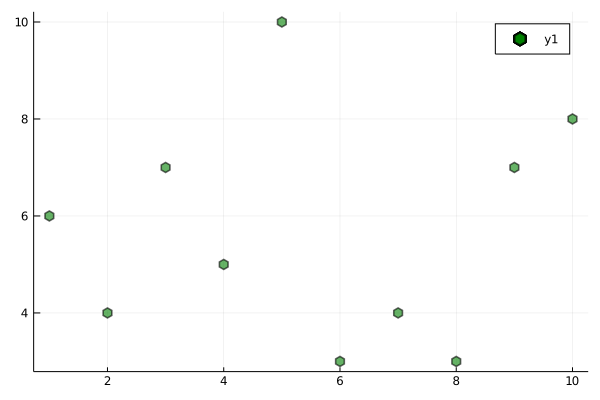

In [30]:
scatter(y,
    markershape = :hexagon,
    markersize = 5,
    markeralpha = 0.6,
    markercolor = :green,
    markerstrokewidth = 2,
    markerstrokealpha = 0.2,
    markerstrokecolor = :black,
    markerstrokestyle = :dot
)

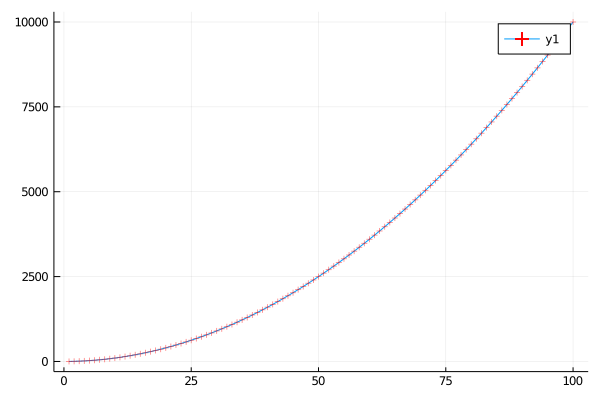

In [31]:
plot(1:1:100, (x)-> x^2,
markershape = :cross,
markersize = 3,
markeralpha = 0.5,
markercolor = :red,
markerstrokewidth = 2,
markerstrokealpha = 0.2,
markerstrokecolor = :black,
markerstrokestyle = :dot
)

Nótese que en el caso anterior el eje `y` se rellenó con una función __anónima__ o una función ___lambda___ de Python. Julia automáticamente reconoce que es una función y ejecuta sobre ella el rango de valores ingresados para generar la gráfica.

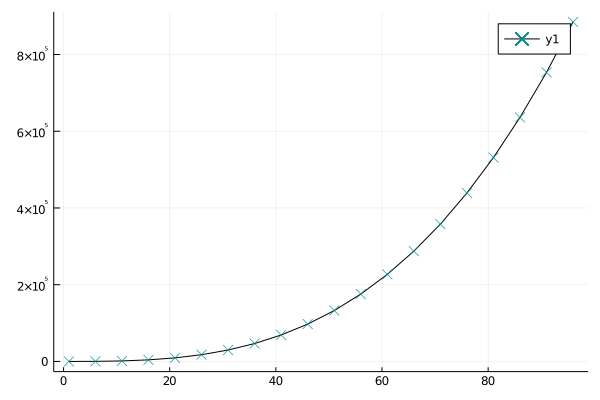

In [32]:
plot(1:5:100, (x)-> x^3,
linecolor = :black,
markershape = :xcross,
markersize = 5,
markeralpha = 0.8,
markercolor = :darkcyan,
markerstrokewidth = 2,
markerstrokealpha = 0.2,
markerstrokecolor = :black,
markerstrokestyle = :dot
)

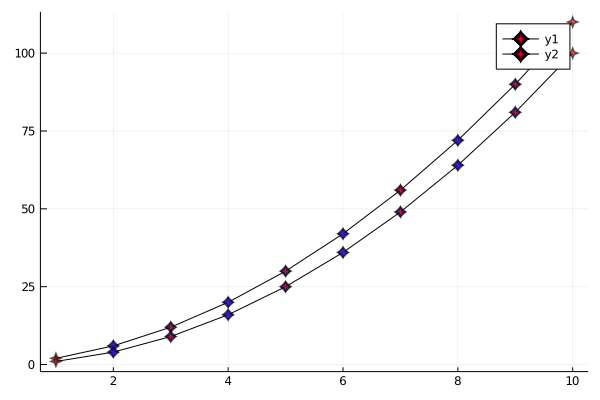

In [33]:
plot(1:1:10, [(x)-> (x^2+x), (y) -> y^2],
linecolor = :black,
markershape = [:star4, :diamond],
markersize = 5,
markeralpha = 0.6,
markercolor = [:red, :blue],
markerstrokewidth = 2,
markerstrokealpha = 0.2,
markerstrokecolor = :black,
markerstrokestyle = :dot
)

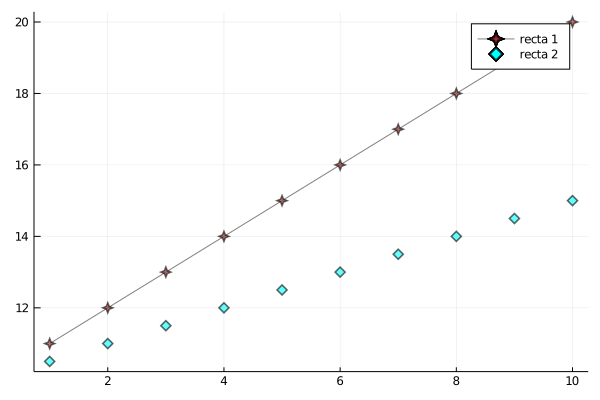

In [34]:
plot(1:1:10, (x) -> x+10,
linecolor = :grey,
markershape = :star4,
label = "recta 1",
markersize = 5,
markeralpha = 0.6,
markercolor = :brown,
markerstrokewidth = 2,
markerstrokealpha = 0.2,
markerstrokecolor = :black,
markerstrokestyle = :dot
)
plot!(1:1:10, (y) -> y/2 + 10,
st = :scatter,
label = "recta 2",
linecolor = :black,
markershape = :diamond,
markersize = 5,
markeralpha = 0.6,
markercolor = :cyan,
markerstrokewidth = 2,
markerstrokealpha = 0.2,
markerstrokecolor = :black,
markerstrokestyle = :dot)
    

## Subplots en Julia
Los __subplots__ son muy útiles en algunos casos. Imaginemos que tenemos 4 sets de datos que representan por ejemplo cuatro respuestas al escalón de 4 sistemas, probablemente queramos ver graficado dichos comportamientos. Pero puede ser un poco difícil de ver los resultados correctamente si todos están juntos en una misma gráfica, por tanto, se pueden utilizar __subplots__. 

En base al ejemplo anterior para solucionarlo fácilmente en Julia se puede utilizar el comando `layout`:

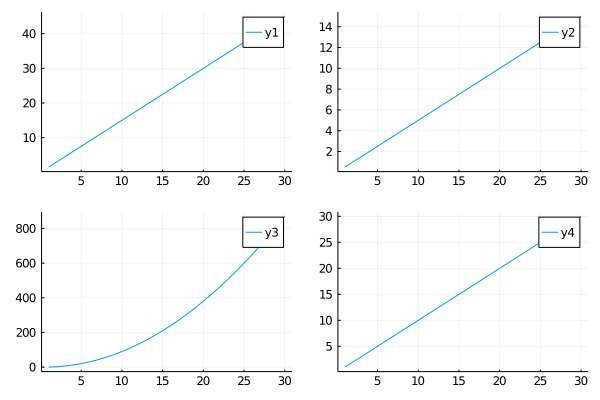

In [35]:
#Primero creamos 4 "sistemas"
sis1(x) = x+x/2
sis2(x) = x-x/2
sis3(x) = x^2 - x
sis4(x) = x
#Sobre los 4 "sistemas" aplicamos un rango de valores y graficamos
plot(1:1:30, [sis1, sis2, sis3, sis4], layout = (2,2))

El uso de `layout` permite poder decir de forma fácil de qué forma queremos que la información sea desplegada, en este caso se pide una matriz `2x2` donde cada entrada es una gráfica. Dependiendo de la forma que se indica el `layout` se puede generar diferentes formas:

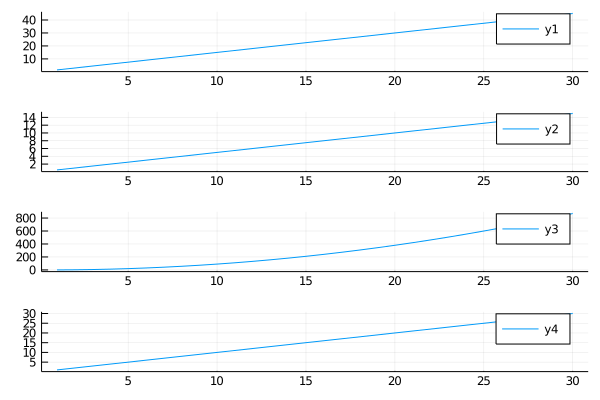

In [36]:
plot(1:1:30, [sis1, sis2, sis3, sis4], layout = (4,1))

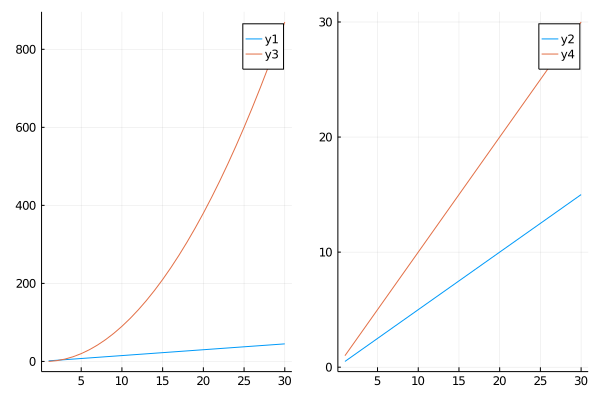

In [37]:
plot(1:1:30, [sis1, sis2, sis3, sis4], layout = (1,2))

Para poder agregar más detalles como títulos y demás se puede seguir el siguiente ejemplo:

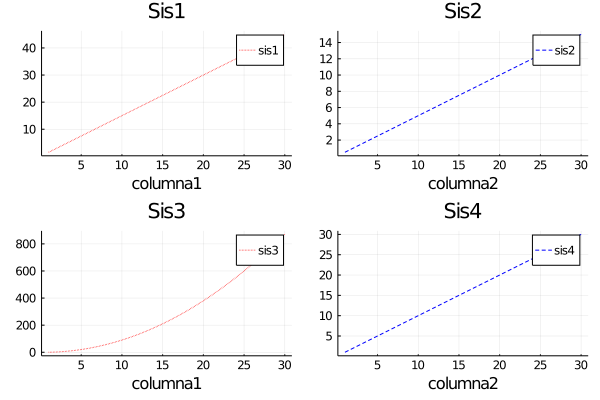

In [38]:
plot(1:1:30, [sis1, sis2, sis3, sis4], layout = (2,2), title = ["Sis1" "Sis2" "Sis3" "Sis4"],
    xlabel = ["columna1" "columna2"], linecolor = [:red :blue], linestyle= [:dot :dash],
    label = ["sis1" "sis2" "sis3" "sis4"])

En el ejemplo anterior se muestran algunas de las cosas que se pueden utilizar para darle más creatividad a los diferentes gráficos, sin embargo, no se cubren todas las posibilidades, se queda como tarea explorar más opciones. Sin embargo, todavía hay algunos ejemplos más que ver, por ejemplo, se puede utilizar la misma idea de `layout` pero con diferentes tipos de gráficos:

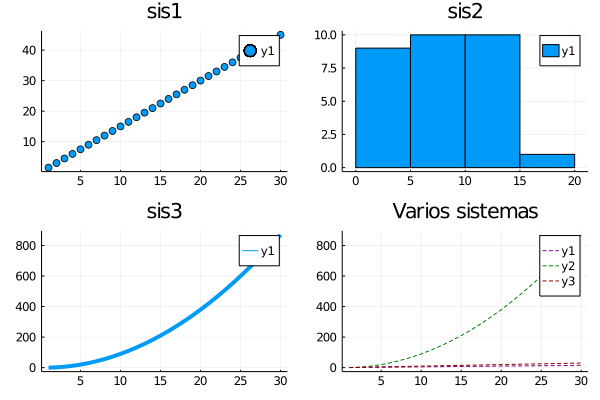

In [39]:
p = scatter(1:1:30, sis1, title = "sis1")
p2 = histogram(1:1:30, sis2, title = "sis2")
p3 = plot(1:1:30, sis3, title = "sis3", lw = 4)
p4 = plot(1:1:30, [sis2,sis3,sis4], title = "Varios sistemas", linestyle = :dash,
    linecolor = [:purple :green :darkred :darkblue])
plot(p,p2,p3,p4, layout = (2,2))

Como detalles finales sobre el uso de `layout` se tiene el uso del constructor `grid` este permite modificar de forma fácil que tanto espacio se le da a cada gráfica, por ejemplo:

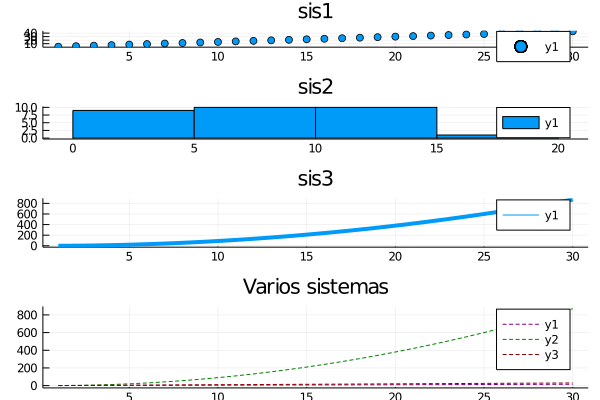

In [40]:
plot(p,p2,p3,p4, layout = grid(4,1 , heights = [0.1, 0.2, 0.3, 0.5]))

Por último, si se desean esquemas más particulares se puede utilizar el macro `@layout` de Julia para crear formas diferentes `layouts`. Tomando el ejemplo de la [documentación oficial](https://docs.juliaplots.org/latest/layouts/#layouts).

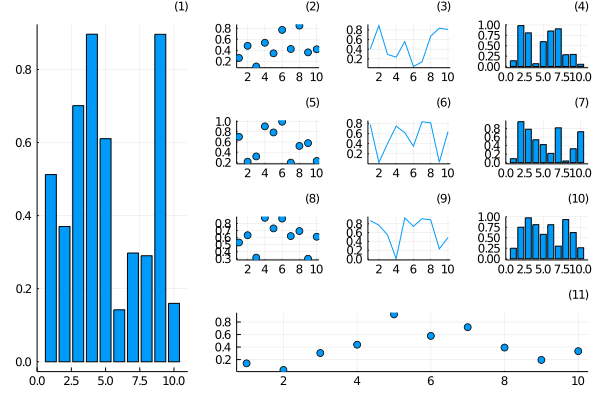

In [41]:
l = @layout [
    a{0.3w} [grid(3,3)
             b{0.2h}  ]
]
plot(
    rand(10, 11),
    layout = l, legend = false, seriestype = [:bar :scatter :path],
    title = ["($i)" for j in 1:1, i in 1:11], titleloc = :right, titlefont = font(8)
)

## Otros Temas
Esta sección cubre algunos temas que se salen de las bases de graficar. 
### Scripting
Cuando se escriben _scrips_ donde se generan varios gráficos, ya sea para un proyecto o tarea, dependiendo de la forma que se está corriendo este puede que los __plots__ que uno crea no aparezcan. Esto sucede porque a diferencia de trabajar en algo como Jupyter donde se pueden correr líneas de código en celdas, en un programa de Julia solo desplegaría la última línea de un programa. Para poder decirle a Julia que debe desplegar un gráfico se debe utilizar la función `display()`. Por ejemplo: 
 ```julia
    display(plot(rand(10), rand(10)))
 ```
O también si se tiene un __plot__ con nombre:
 ```julia
    p = plot(x,y)
    display(p)
 ```
El utilizar el la función `display()` le indica a Julia que debe desplegar el ___output___ de ese código, en el caso de `plot()` seria la gráfica como tal. 
### Otros tipos de gráficos
Julia permite gran variedad de ___plots___ los cuales pueden ser útiles en diferentes escenarios, como primer ejemplo imagínenos que necesitamos graficar una superficie:


### Ejemplo de superficie en Julia

Un ejemplo más visualmente interesante es crear un __plot__ del tipo `surface` que sirve para casos en 3d con superficies. Tomando una función 

$$ sin(5x)\cdot \frac{cos(5y)}{5} = z $$ 

la cual se grafica de -1 a 1 con 200 pasos en sus ejes. Para crear el rango de valores se utiliza la función `range()`. La documentación de la función se puede encontrar [acá](https://docs.julialang.org/en/v1/base/math/), en resumen, las siguientes dos expresiones son equivalentes:
 ```julia
    1:0.5:10
    range(1,10, length = 19)
 ```
O también como lo siguiente:
 ```julia
    1:0.5:10
    range(1,10, step = 0.5)
 ```
Continuando con el ejemplo, una vez que se tienen los rangos de valores a evaluar en Julia se tiene la facilidad de que en estos casos el eje __z__ de la función a graficar puede ser la función misma como la siguiente sintaxis:
 ```julia
    plot(x_values, y_values, fuction(x_values,y_values) ...)
 ```
En Julia utilizando la sintaxis anterior automáticamente se evalúan los valores de `x` y `y` en la función y ese valor es el que grafica en el eje __z__ de forma fácil. El ejemplo entonces se puede graficar muy fácilmente con lo siguiente:

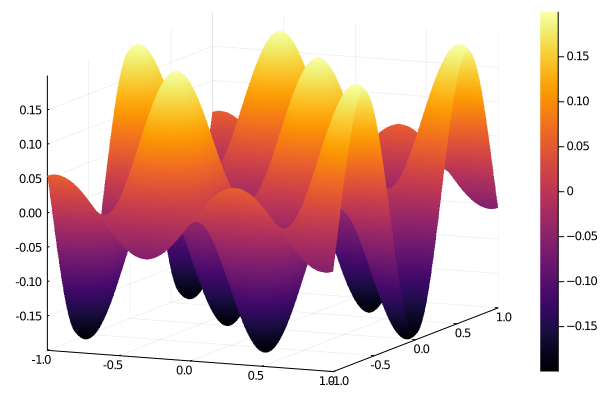

In [42]:
x = y = range(-1,1, length = 500)
f(x,y) = sin(5x)*cos(5y)/5
plot(x,y,f, st = :surface)

El segundo ejemplo es aún más complejo y se toma de la [documentación oficial](http://docs.juliaplots.org/latest/) el ejemplo se adjunta solo para mostrar las capacidades de Julia y lo que se puede lograr en pocas líneas de código conociendo muy bien las capacidades del lenguaje. Gran parte de este ejemplo utiliza atributos innatos para superficies y por tanto no se cubren con detalle en esta guía.

┌ Info: Saved animation to 
│   fn = C:\Users\josea\Dropbox\II_2020\tmp.gif
└ @ Plots C:\Users\josea\.julia\packages\Plots\shY1Z\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\josea\\Dropbox\\II_2020\\tmp.gif")
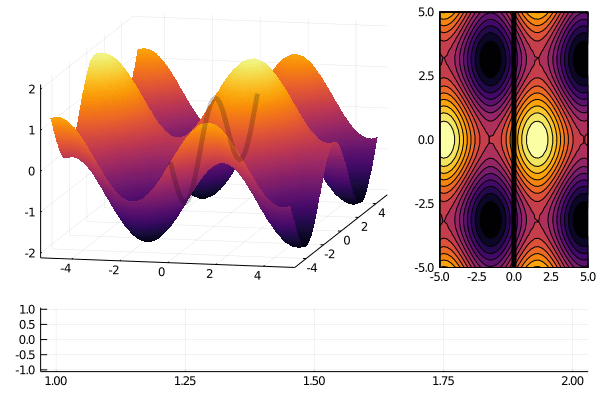

In [43]:
using Plots
default(legend = false)
x = y = range(-5, 5, length = 40)
zs = zeros(0, 40)
n = 100

@gif for i in range(0, stop = 2π, length = n)
    f(x, y) = sin(x + 10sin(i)) + cos(y)

    # create a plot with 3 subplots and a custom layout
    l = @layout [a{0.7w} b; c{0.2h}]
    p = plot(x, y, f, st = [:surface, :contourf], layout = l)

    # induce a slight oscillating camera angle sweep, in degrees (azimuth, altitude)
    plot!(p[1], camera = (10 * (1 + cos(i)), 40))

    # add a tracking line
    fixed_x = zeros(40)
    z = map(f, fixed_x, y)
    plot!(p[1], fixed_x, y, z, line = (:black, 5, 0.2))
    vline!(p[2], [0], line = (:black, 5))

    # add to and show the tracked values over time
    global zs = vcat(zs, z')
    plot!(p[3], zs, alpha = 0.2, palette = cgrad(:blues).colors)
end

### Uso de temas 
Julia posee un paquete llamado `PlotThemes` el cual como dice su nombre puede construir gráficos utilizando temas que este paquete posee. El repositorio oficial del paquete se encuentra en [PlotThemes.jl](https://github.com/JuliaPlots/PlotThemes.jl). Algunos de los temas que se soportan son:

- `:dark`
- `:juno`
- `:lime`
- `:sand`

Entre otros, a al hora de elegir un tema de utiliza el comando `theme()`, los ___plots___ siguientes a este comando tomaran el tema elegido. Para volver al tema original de utiliza el atribulo `:default` de la forma `theme(:default)`. Algunos ejemplos de cómo se ven son: 

In [44]:
using PlotThemes

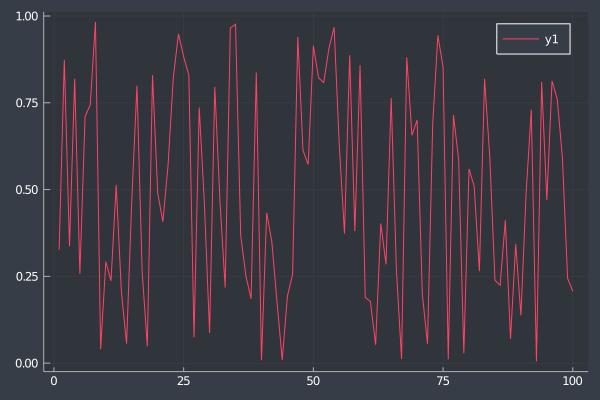

In [45]:
theme(:dark)
plot(rand(100))

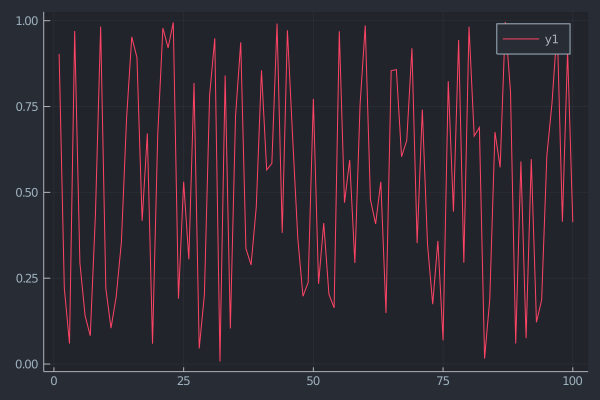

In [46]:
theme(:juno)
plot(rand(100))

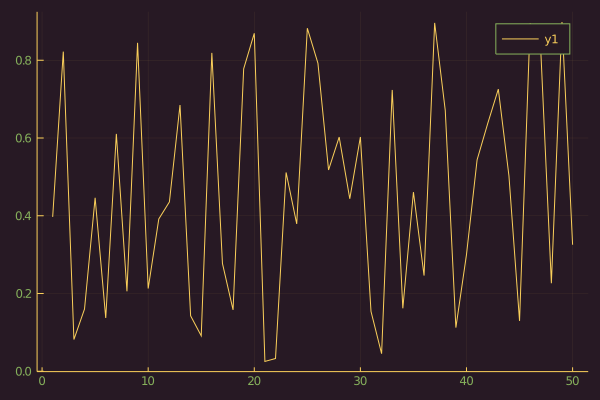

In [47]:
theme(:orange)
plot(rand(50))

### Uso de Polynomials
Entre los muchos paquetes de Julia existe el paquete `Polynomials` dicho paquete permite la utilización de polinomios de manera muy simple. Este paquete habilita el manejo de polinomios de una __sola variable__, para polinomios de más variables existe el paquete `MultivariatePolynomials.jl`. Continuando entonces, para poder crear un polinomio se puede hacer de dos formas:

In [48]:
using Polynomials
theme(:default)

La primera forma es por medio de la función `Polynomial()` donde se le pasan los coeficientes de las variables de izquierda a derecha para ir aumentando su potencia. Por ejemplo:

In [49]:
Polynomial([1,2,3,4])

Polynomial(1 + 2*x + 3*x^2 + 4*x^3)

Si se desea crear un polinomio que no sea con la variable `x` se puede indicar la variable a utilizar por medio de la siguiente sintaxis: 

In [50]:
Polynomial([1,2,3,4], :s)

Polynomial(1 + 2*s + 3*s^2 + 4*s^3)

El segundo método consiste en crear el polinomio en base a sus __raíces__, es decir si solo hay una raíz `-2` el polinomio seria en ese caso `x+2`. Para ello entonces se usa la función `fromroots()` de la siguiente forma:

In [51]:
fromroots([-2])

Polynomial(2 + x)

In [52]:
fromroots([-2,1,3])

Polynomial(6 - 5*x - 2*x^2 + x^3)

In [53]:
fromroots([1,2,3,4,5])

Polynomial(-120 + 274*x - 225*x^2 + 85*x^3 - 15*x^4 + x^5)

Ahora para poder evaluar algún polinomio se puede hacer de forma muy fácil, primero creemos un polinomio como si fuera un variable:

In [54]:
pol = Polynomial([1,2,3,4])

Polynomial(1 + 2*x + 3*x^2 + 4*x^3)

Para evaluar nuestro polinomio anterior basta con evaluar su nombre como si fuera un función por ejemplo:

In [55]:
pol(10)

4321

In [56]:
pol(5)

586

In [57]:
pol(-2)

-23

Antes de continuar con las demás capacidades de este paquete, parte de la idea de incluir la explicación de este es que se puede utilizar para realizar graficas. Utilizando la función anterior de evaluar el polinomio en conjunto con un poco de código en Julia podemos graficar fácilmente el polinomio. Por ejemplo:

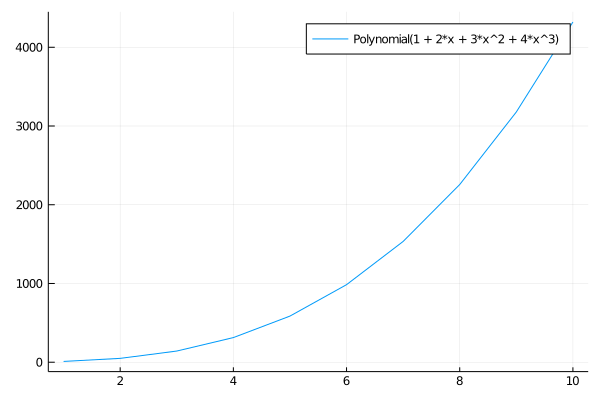

In [58]:
pol_y_values = [pol(i) for i in 1:10]
plot(1:10, pol_y_values, label = pol)

La utilización de __Array Comprehensions__ de Julia permite rápidamente poder graficar polinomios como el anterior. Se pueden también graficar varios polinomios siguiendo el siguiente ejemplo:

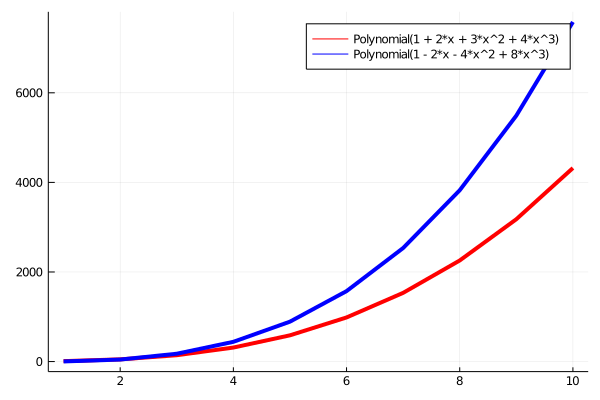

In [59]:
pol2 = Polynomial([1,-2,-4,8])
pol2_vals = [pol2(i) for i in 1:10]
plot(1:10, [pol_y_values, pol2_vals], label = [pol pol2], lw = 4, linecolor = [:red :blue])

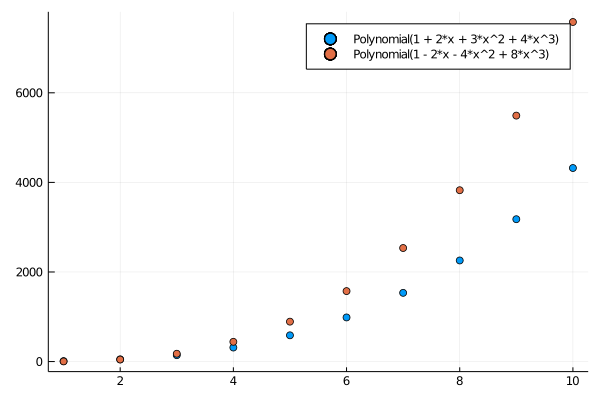

In [60]:
scatter(1:10, [pol_y_values, pol2_vals], label = [pol pol2])

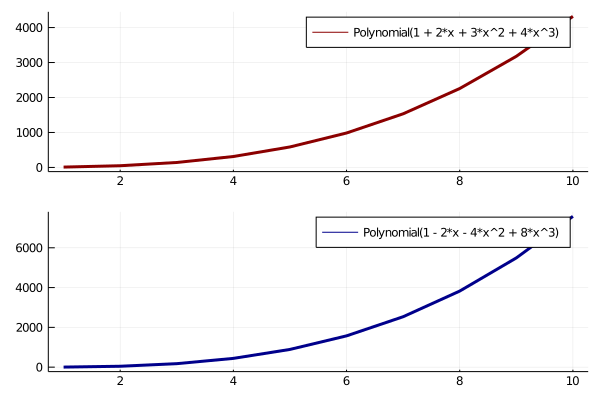

In [61]:
plot(1:10, [pol_y_values, pol2_vals], label = [pol pol2], lw = 3, linecolor = [:darkred :darkblue], layout = (2,1))

Continuando con las capacidades del paquete, este implemente variadas operaciones de polinomios como los son:

- Suma
- Resta
- División
- Multiplicación

Dichas operaciones anteriores se pueden utilizar sobre varios polinomios siempre y cuando tengas la misma __variable__, usualmente `x`. Por ejemplo:


In [62]:
pol1 = Polynomial([1,2])
pol2 = Polynomial([3,4])

Polynomial(3 + 4*x)

In [63]:
pol1 + pol2 

Polynomial(4 + 6*x)

In [64]:
pol1 - pol2 

Polynomial(-2 - 2*x)

In [65]:
pol1 * pol2 

Polynomial(3 + 10*x + 8*x^2)

In [66]:
3pol1

Polynomial(3 + 6*x)

La división es un caso un poco particular dado que para dividir dos polinomios se debe usar la función `div()` la cual retorna el resultado de la división nada más. Si se desea el residuo de la división se puede usar `rem()` lo cual solo retorna el residuo, si se desea ambos el residuo y la división se puede utilizar `divrem()`. Por otro lado, si lo que se quiere es dividir un polinomio con un número se puede hacer normalmente por medio del operador `/`.

In [67]:
div(pol1,pol2)

Polynomial(0.5)

In [68]:
rem(pol1,pol2)

Polynomial(-0.5)

In [69]:
divrem(pol1,pol2)

(Polynomial(0.5), Polynomial(-0.5))

In [70]:
pol1/2

Polynomial(0.5 + 1.0*x)

In [71]:
pol1 * pol2 + 5 - div(pol1,2pol2)

Polynomial(7.75 + 10.0*x + 8.0*x^2)

Otra funcionalidad incluida en este paquete es la posibilidad de integrar y derivar los polinomios por medio de las funciones `derivative()` y `integrate()`. 

In [72]:
derivative(pol1)

Polynomial(2)

In [73]:
integrate(Polynomial([1,1,-1]))

Polynomial(1.0*x + 0.5*x^2 - 0.3333333333333333*x^3)

Por último, también se incluye la funcionalidad de encontrar las raíces de los polinomios por medio de la función `roots()`:

In [74]:
roots(pol1)

1-element Array{Float64,1}:
 -0.5

In [75]:
roots(pol2)

1-element Array{Float64,1}:
 -0.75

In [76]:
roots(Polynomial([1,0,3,0,9]))

4-element Array{Complex{Float64},1}:
 -0.28867513459481287 - 0.4999999999999993im
 -0.28867513459481287 + 0.4999999999999993im
  0.28867513459481303 - 0.49999999999999967im
  0.28867513459481303 + 0.49999999999999967im

Como se puede ver el ejemplo anterior, también se pueden retornar resultados imaginarios.